# Sanity check for trained model 
- load a saved model
- make a tiny test dataset with 10 examples from each class
- make predictions on these test examples
- display the spectrograms, audio and model prediction for each of the examples. 

This report shows the model's prediction vs. ground truth for a few examples. In the examples, the Olive Sided Flycatcher (OSFL) is either __present__ or __absent__

- __Present__ - The 3s clip of audio contains a complete human labelled tag of the OSFL. 
- __Absent__ - The example is audio taken from before the start of a human labelled OSFL tag. 

The scores are made on a validation set, which is defined as 
- The unseen audio from 20% of the ARU locations in the training set. The model has not been trained on audio from these locations. 

#### There is some further processing which need to be applied to this dataset:
- __Mix in audio from other times of day, and other habitats__. This is to ensure that the training data contains as much variety as possible. 
- __Replace the human labelled audio samples with high scoring ones picked out by HawkEars model__ - these should end up all being focal recordings. This is assumed to produce a relationsip between sound power and recognizer score. This will enable density estimation and other downstream statistical applications. 
- __bandpass the input signal__ to remove sounds from frequencies outside the OSFL vocalization range
- Go through the audio samples in the validation set and remove any which are obviously labelled incorrectly, and flag those which are borderline.

In [85]:
# imports
from pathlib import Path
import pandas as pd
import sys
BASE_PATH = Path.cwd().parent.parent
sys.path.append(str(BASE_PATH))
from src.utils import show_sample_from_df
import pandas as pd
import opensoundscape as opso
from opensoundscape import Audio, Spectrogram
import numpy as np


In [86]:
# Load the validation set
train_valid_set_path = BASE_PATH / 'data' / 'interim' / 'valid_set' 
valid_set = pd.read_pickle(train_valid_set_path / 'valid_df_swap.pkl')
valid_set.sample(5)

,,,target_absence,target_presence
file,start_time,end_time,,
../../data/raw/recordings/OSFL/recording-331717.mp3,19.5,22.5,1.0,0.0
../../data/raw/recordings/OSFL/recording-552869.flac,109.5,112.5,1.0,0.0
../../data/raw/recordings/OSFL/recording-320889.mp3,316.5,319.5,1.0,0.0
../../data/raw/recordings/OSFL/recording-320811.mp3,283.5,286.5,1.0,0.0
../../data/raw/recordings/OSFL/recording-4907.flac,3.0,6.0,1.0,0.0


In [87]:
# Take a sample of 10 from each class
present_samples = valid_set.loc[valid_set['target_presence']==1].sample(10)
absent_samples = valid_set.loc[valid_set['target_absence']==1].sample(10)
present_samples.index[0]

(PosixPath('../../data/raw/recordings/OSFL/recording-292876.mp3'), 4.5, 7.5)

In [89]:
# Load a trained model. 
model = opso.cnn.load_model(BASE_PATH / 'models' / 'osfl_model_28022024_swap')
model.valid_metrics

{0: {'confusion_matrix': array([[   42, 12593],
         [    4,  1144]]),
  'precision': 0.08327873625973647,
  'recall': 0.9965156794425087,
  'f1': 0.1537117903930131,
  'jaccard': 0.04328877077999552,
  'hamming_loss': 0.9139519698178916},
 1: {'confusion_matrix': array([[  416, 12219],
         [   18,  1130]]),
  'precision': 0.08465053562064574,
  'recall': 0.9843205574912892,
  'f1': 0.15589432296337172,
  'jaccard': 0.05870706183160341,
  'hamming_loss': 0.887832837553508},
 2: {'confusion_matrix': array([[5074, 7561],
         [ 185,  963]]),
  'precision': 0.1129751290473956,
  'recall': 0.8388501742160279,
  'f1': 0.19913151364764267,
  'jaccard': 0.25318154923923447,
  'hamming_loss': 0.5619966625553218},
 3: {'confusion_matrix': array([[12275,   360],
         [  742,   406]]),
  'precision': 0.5300261096605744,
  'recall': 0.35365853658536583,
  'f1': 0.42424242424242425,
  'jaccard': 0.5934252822007924,
  'hamming_loss': 0.07995356598708554},
 4: {'confusion_matrix': ar

In [90]:
valid_set_preds = model.predict(valid_set, batch_size=32, activation_layer='softmax')

  0%|          | 0/431 [00:00<?, ?it/s]

/Users/mikeg/miniforge3/envs/osfl2/lib/python3.10/site-packages/opensoundscape/audio.py:340: UserWarning: Audio object is shorter than requested duration: 2.8619727891156463 sec instead of 3.0 sec
  warnings.warn(error_msg)
/Users/mikeg/miniforge3/envs/osfl2/lib/python3.10/site-packages/opensoundscape/audio.py:340: UserWarning: Audio object is shorter than requested duration: 2.8619727891156463 sec instead of 3.0 sec
  warnings.warn(error_msg)
/Users/mikeg/miniforge3/envs/osfl2/lib/python3.10/site-packages/opensoundscape/audio.py:340: UserWarning: Audio object is shorter than requested duration: 2.8619727891156463 sec instead of 3.0 sec
  warnings.warn(error_msg)


# Important 
Swap the order of the columns if necessary so that absent is at index 0 and present is at index 1 to make the confusion matrix display correctly. 


In [91]:
valid_set.columns, valid_set_preds.columns

(Index(['target_absence', 'target_presence'], dtype='object'),
 Index(['target_absence', 'target_presence'], dtype='object'))

In [92]:
valid_set = valid_set[["target_absence", "target_presence"]]
valid_set_preds = valid_set_preds[["target_absence", "target_presence"]]

# Sigmoid or Softmax activation?
### Softmax activation
- Advantage : Softmax output would mean we can easily combine both class predictions into one number - since both classes will sum to 1, the absence can be calculated from the presence score. 
- Disadvantage 1: The outputs of softmax activation get strongly transformed and become artificially close to 0 or 1. This means that the shape of the score vs. sound power level curve might get squashed into a narrower range of possible values compared with sigmoid activation. 
- Disadvantage 2: Additionally the highest scoring samples might fall off the bottom of the floating point precision for 32 bit floating point numbers - and we can see this happening in the example below. 

### Sigmoid activation
- Advantage: The output scores are less strongly transformed than in the softmax case, and they tend to spread across a wider range of numbers between 0 and 1. 
- Disadvantage: The output is in the form of 2 numbers. Choosing to only display the score for target presence won't tell the whole story since it is the relative level of confidence of the present and absent classes which decides the final prediction.  

In [93]:
# Example sigmoid outputs
present_preds = model.predict(present_samples, activation_layer='sigmoid')
absent_preds = model.predict(absent_samples, activation_layer='sigmoid')
present_preds

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

target_absence  \
file                                               start_time end_time                   
../../data/raw/recordings/OSFL/recording-292876... 4.5        7.5             0.478543   
../../data/raw/recordings/OSFL/recording-295707... 7.5        10.5            0.121496   
../../data/raw/recordings/OSFL/recording-255625... 21.0       24.0            0.103098   
                                                   4.5        7.5             0.009695   
../../data/raw/recordings/OSFL/recording-541593... 3.0        6.0             0.991417   
../../data/raw/recordings/OSFL/recording-292568... 34.5       37.5            0.631093   
../../data/raw/recordings/OSFL/recording-292875... 0.0        3.0             0.938287   
../../data/raw/recordings/OSFL/recording-552546... 34.5       37.5            0.030353   
../../data/raw/recordings/OSFL/recording-556936... 1.5        4.5             0.026411   
../../data/raw/recordings/OSFL/recording-292615... 21.0       24.0            0.209496   

                                                                        target_presence  
file                                               start_time end_time                   
../../data/raw/recordings/OSFL/recording-292876... 4.5        7.5              0.405302  
../../data/raw/recordings/OSFL/recording-295707... 7.5        10.5             0.867816  
../../data/raw/recordings/OSFL/recording-255625... 21.0       24.0             0.881620  
                                                   4.5        7.5              0.987619  
../../data/raw/recordings/OSFL/recording-541593... 3.0        6.0              0.011284  
../../data/raw/recordings/OSFL/recording-292568... 34.5       37.5             0.294978  
../../data/raw/recordings/OSFL/recording-292875... 0.0        3.0              0.085039  
../../data/raw/recordings/OSFL/recording-552546... 34.5       37.5             0.962892  
../../data/raw/recordings/OSFL/recording-556936... 1.5        4.5              0.968067  
../../data/raw/recordings/OSFL/recording-292615... 21.0       24.0             0.881824

In [94]:
# Example softmax outputs
present_preds = model.predict(present_samples, activation_layer='softmax')
absent_preds = model.predict(absent_samples, activation_layer='softmax')
present_preds

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

target_absence  \
file                                               start_time end_time                   
../../data/raw/recordings/OSFL/recording-292876... 4.5        7.5             0.573842   
../../data/raw/recordings/OSFL/recording-295707... 7.5        10.5            0.020631   
../../data/raw/recordings/OSFL/recording-255625... 21.0       24.0            0.015200   
                                                   4.5        7.5             0.000123   
../../data/raw/recordings/OSFL/recording-541593... 3.0        6.0             0.999901   
../../data/raw/recordings/OSFL/recording-292568... 34.5       37.5            0.803487   
../../data/raw/recordings/OSFL/recording-292875... 0.0        3.0             0.993924   
../../data/raw/recordings/OSFL/recording-552546... 34.5       37.5            0.001205   
../../data/raw/recordings/OSFL/recording-556936... 1.5        4.5             0.000894   
../../data/raw/recordings/OSFL/recording-292615... 21.0       24.0            0.034297   

                                                                        target_presence  
file                                               start_time end_time                   
../../data/raw/recordings/OSFL/recording-292876... 4.5        7.5              0.426158  
../../data/raw/recordings/OSFL/recording-295707... 7.5        10.5             0.979369  
../../data/raw/recordings/OSFL/recording-255625... 21.0       24.0             0.984800  
                                                   4.5        7.5              0.999877  
../../data/raw/recordings/OSFL/recording-541593... 3.0        6.0              0.000099  
../../data/raw/recordings/OSFL/recording-292568... 34.5       37.5             0.196513  
../../data/raw/recordings/OSFL/recording-292875... 0.0        3.0              0.006076  
../../data/raw/recordings/OSFL/recording-552546... 34.5       37.5             0.998795  
../../data/raw/recordings/OSFL/recording-556936... 1.5        4.5              0.999106  
../../data/raw/recordings/OSFL/recording-292615... 21.0       24.0             0.965703

In [95]:
# rename columns for better clarity after they're combined
present_samples.rename(columns = {'target_presence':'present_label', 'target_absence':'absent_label'}, inplace = True) 
present_preds.rename(columns = {'target_presence':'present_pred', 'target_absence':'absent_pred'}, inplace = True)
absent_samples.rename(columns = {'target_presence':'present_label', 'target_absence':'absent_label'}, inplace = True)
absent_preds.rename(columns = {'target_presence':'present_pred', 'target_absence':'absent_pred'}, inplace = True)

# combine labels and predictions for samples of present and absent classes
present_labels_and_preds = pd.concat([present_samples, present_preds], axis=1)
absent_labels_and_preds = pd.concat([absent_samples, absent_preds], axis=1)
combined = pd.concat([present_labels_and_preds, absent_labels_and_preds], axis=0)
combined = combined[["absent_label", "present_label", "absent_pred", "present_pred"]] # This is to make the confusion matrix work. 
combined

absent_label  \
file                                               start_time end_time                 
../../data/raw/recordings/OSFL/recording-292876... 4.5        7.5                0.0   
../../data/raw/recordings/OSFL/recording-295707... 7.5        10.5               0.0   
../../data/raw/recordings/OSFL/recording-255625... 21.0       24.0               0.0   
                                                   4.5        7.5                0.0   
../../data/raw/recordings/OSFL/recording-541593... 3.0        6.0                0.0   
../../data/raw/recordings/OSFL/recording-292568... 34.5       37.5               0.0   
../../data/raw/recordings/OSFL/recording-292875... 0.0        3.0                0.0   
../../data/raw/recordings/OSFL/recording-552546... 34.5       37.5               0.0   
../../data/raw/recordings/OSFL/recording-556936... 1.5        4.5                0.0   
../../data/raw/recordings/OSFL/recording-292615... 21.0       24.0               0.0   
../../data/raw/recordings/OSFL/recording-291647... 106.5      109.5              1.0   
../../data/raw/recordings/OSFL/recording-615591... 36.0       39.0               1.0   
../../data/raw/recordings/OSFL/recording-292035... 4.5        7.5                1.0   
../../data/raw/recordings/OSFL/recording-481327... 73.5       76.5               1.0   
../../data/raw/recordings/OSFL/recording-552930... 21.0       24.0               1.0   
../../data/raw/recordings/OSFL/recording-291482... 4.5        7.5                1.0   
../../data/raw/recordings/OSFL/recording-293421... 88.5       91.5               1.0   
../../data/raw/recordings/OSFL/recording-400969... 19.5       22.5               1.0   
../../data/raw/recordings/OSFL/recording-553720... 12.0       15.0               1.0   
../../data/raw/recordings/OSFL/recording-186153... 0.0        3.0                1.0   

                                                                        present_label  \
file                                               start_time end_time                  
../../data/raw/recordings/OSFL/recording-292876... 4.5        7.5                 1.0   
../../data/raw/recordings/OSFL/recording-295707... 7.5        10.5                1.0   
../../data/raw/recordings/OSFL/recording-255625... 21.0       24.0                1.0   
                                                   4.5        7.5                 1.0   
../../data/raw/recordings/OSFL/recording-541593... 3.0        6.0                 1.0   
../../data/raw/recordings/OSFL/recording-292568... 34.5       37.5                1.0   
../../data/raw/recordings/OSFL/recording-292875... 0.0        3.0                 1.0   
../../data/raw/recordings/OSFL/recording-552546... 34.5       37.5                1.0   
../../data/raw/recordings/OSFL/recording-556936... 1.5        4.5                 1.0   
../../data/raw/recordings/OSFL/recording-292615... 21.0       24.0                1.0   
../../data/raw/recordings/OSFL/recording-291647... 106.5      109.5               0.0   
../../data/raw/recordings/OSFL/recording-615591... 36.0       39.0                0.0   
../../data/raw/recordings/OSFL/recording-292035... 4.5        7.5                 0.0   
../../data/raw/recordings/OSFL/recording-481327... 73.5       76.5                0.0   
../../data/raw/recordings/OSFL/recording-552930... 21.0       24.0                0.0   
../../data/raw/recordings/OSFL/recording-291482... 4.5        7.5                 0.0   
../../data/raw/recordings/OSFL/recording-293421... 88.5       91.5                0.0   
../../data/raw/recordings/OSFL/recording-400969... 19.5       22.5                0.0   
../../data/raw/recordings/OSFL/recording-553720... 12.0       15.0                0.0   
../../data/raw/recordings/OSFL/recording-186153... 0.0        3.0                 0.0   

                                                                        absent_pred  \
file                                               start_time end_time                
..

In [96]:
def show_example(counter):
    path, offset, end_time = combined.index[counter]
    duration = end_time - offset
    audio = Audio.from_file(path, offset=offset, duration=duration)
    spectrogram = Spectrogram.from_audio(audio)
    print(path, offset, end_time)
    print(audio.metadata)
    print(f"Present Prediction = {combined.iloc[counter].present_pred} \nActual = {combined.iloc[counter].present_label}")
    print("Check below")
    audio.show_widget()
    spectrogram.plot()
    counter += 1
    return counter


# Show Predictions
See example labels, predictions, audio and spectrograms below

In [97]:
next_example_idx = 0

../../data/raw/recordings/OSFL/recording-292876.mp3 4.5 7.5
{'samplerate': 44100, 'format': 'MP3', 'frames': 7957844, 'sections': 1, 'subtype': 'MPEG_LAYER_III', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Present Prediction = 0.42615845799446106 
Actual = 1.0
Check below


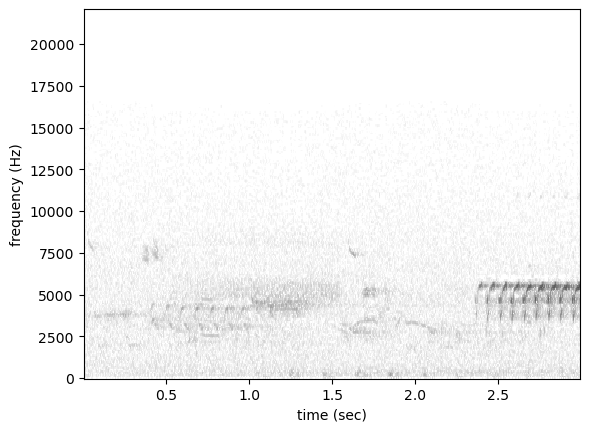

In [98]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-295707.mp3 7.5 10.5
{'samplerate': 44100, 'format': 'MP3', 'frames': 2653384, 'sections': 1, 'subtype': 'MPEG_LAYER_III', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Present Prediction = 0.9793692231178284 
Actual = 1.0
Check below


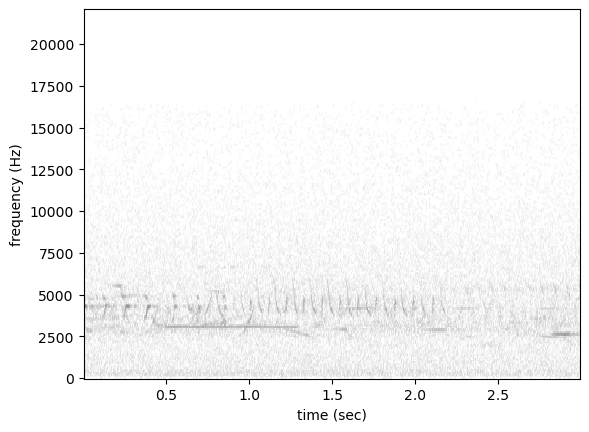

In [99]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-255625.flac 21.0 24.0
{'comment': 'Processed by SoX', 'samplerate': 44100, 'format': 'FLAC', 'frames': 26459904, 'sections': 1, 'subtype': 'PCM_16', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Present Prediction = 0.9847997426986694 
Actual = 1.0
Check below


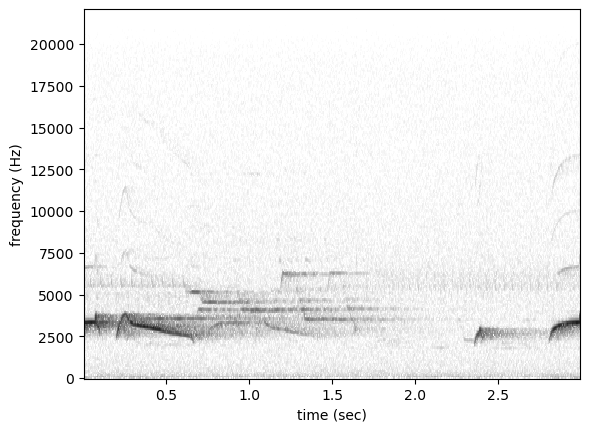

In [100]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-255625.flac 4.5 7.5
{'comment': 'Processed by SoX', 'samplerate': 44100, 'format': 'FLAC', 'frames': 26459904, 'sections': 1, 'subtype': 'PCM_16', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Present Prediction = 0.9998773336410522 
Actual = 1.0
Check below


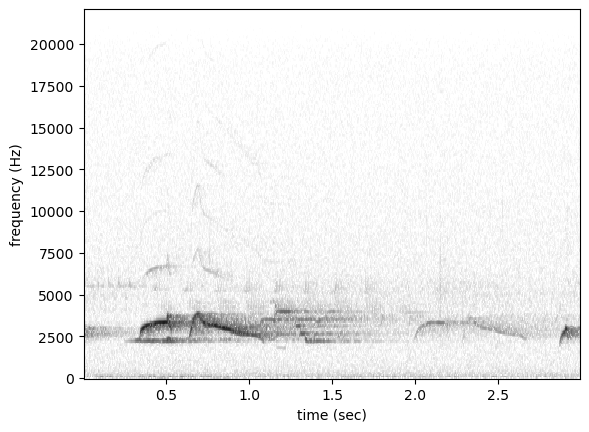

In [101]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-541593.flac 3.0 6.0
{'comment': 'Processed by SoX', 'samplerate': 44100, 'format': 'FLAC', 'frames': 7938000, 'sections': 1, 'subtype': 'PCM_16', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Present Prediction = 9.879361459752545e-05 
Actual = 1.0
Check below


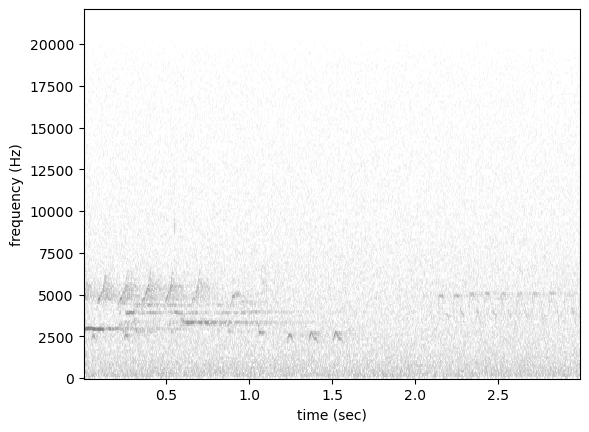

In [102]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-292568.mp3 34.5 37.5
{'samplerate': 44100, 'format': 'MP3', 'frames': 7957844, 'sections': 1, 'subtype': 'MPEG_LAYER_III', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Present Prediction = 0.19651257991790771 
Actual = 1.0
Check below


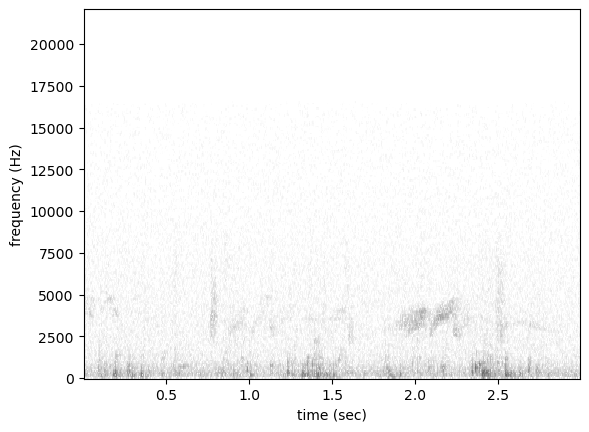

In [103]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-292875.mp3 0.0 3.0
{'samplerate': 44100, 'format': 'MP3', 'frames': 7957844, 'sections': 1, 'subtype': 'MPEG_LAYER_III', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Present Prediction = 0.0060759237967431545 
Actual = 1.0
Check below


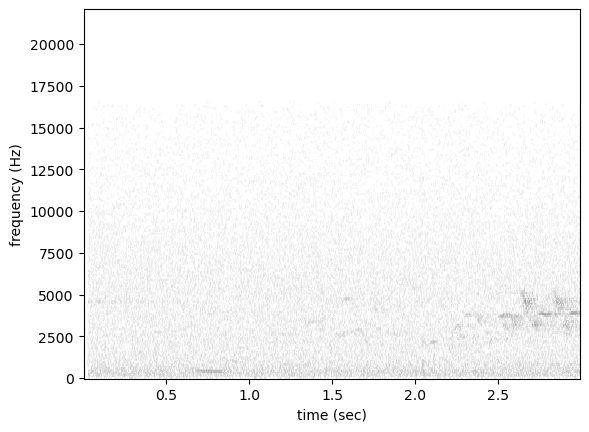

In [104]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-552546.flac 34.5 37.5
{'comment': 'Processed by SoX', 'samplerate': 44100, 'format': 'FLAC', 'frames': 13225973, 'sections': 1, 'subtype': 'PCM_16', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Present Prediction = 0.9987950325012207 
Actual = 1.0
Check below


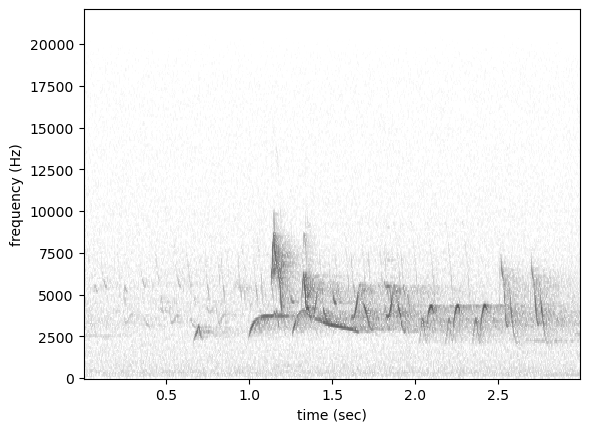

In [105]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-556936.flac 1.5 4.5
{'comment': 'Processed by SoX', 'samplerate': 44100, 'format': 'FLAC', 'frames': 2646000, 'sections': 1, 'subtype': 'PCM_16', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Present Prediction = 0.9991059899330139 
Actual = 1.0
Check below


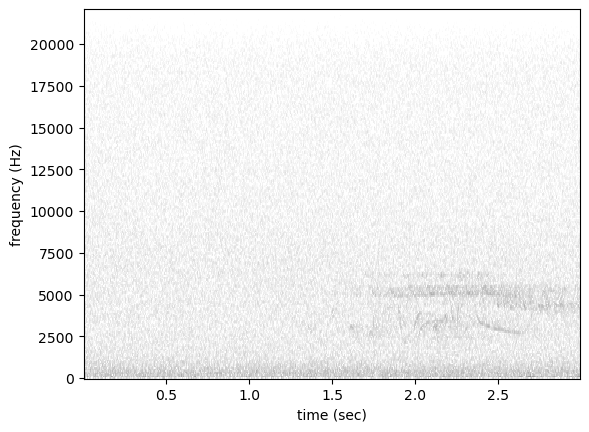

In [106]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-292615.mp3 21.0 24.0
{'samplerate': 44100, 'format': 'MP3', 'frames': 7957844, 'sections': 1, 'subtype': 'MPEG_LAYER_III', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Present Prediction = 0.9657025337219238 
Actual = 1.0
Check below


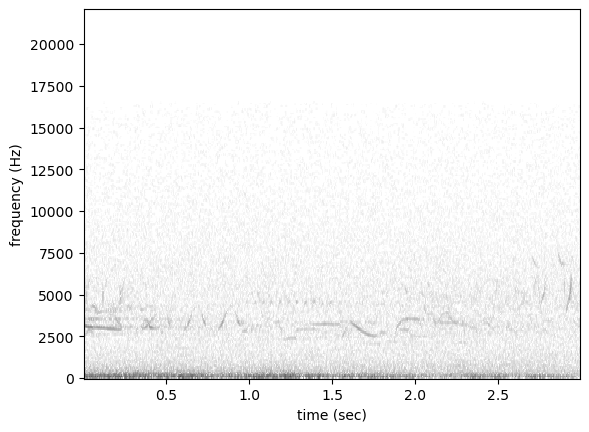

In [107]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-291647.mp3 106.5 109.5
{'samplerate': 44100, 'format': 'MP3', 'frames': 13259997, 'sections': 1, 'subtype': 'MPEG_LAYER_III', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Present Prediction = 0.00012125121429562569 
Actual = 0.0
Check below


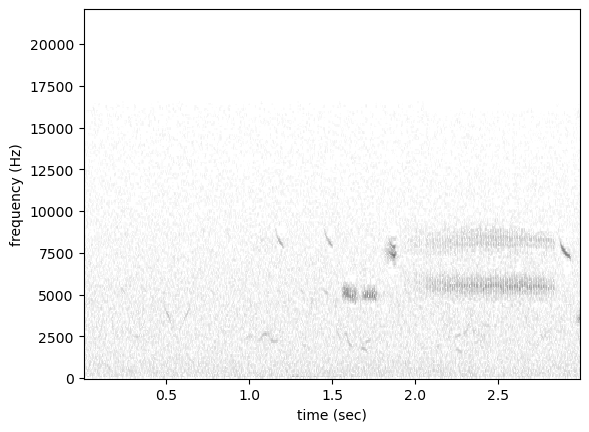

In [108]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-615591.flac 36.0 39.0
{'comment': 'Processed by SoX', 'samplerate': 44100, 'format': 'FLAC', 'frames': 26460032, 'sections': 1, 'subtype': 'PCM_16', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Present Prediction = 0.0017131216591224074 
Actual = 0.0
Check below


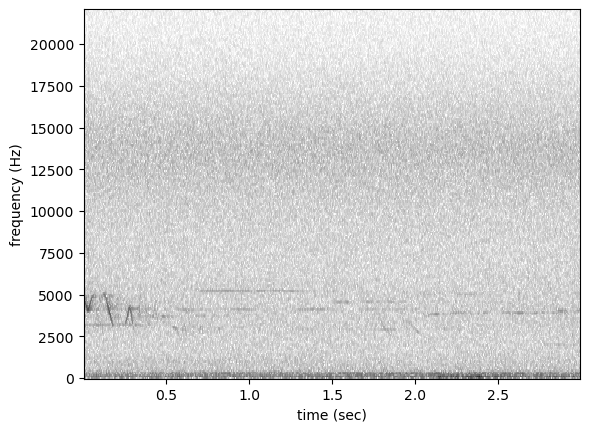

In [109]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-292035.mp3 4.5 7.5
{'samplerate': 44100, 'format': 'MP3', 'frames': 13259997, 'sections': 1, 'subtype': 'MPEG_LAYER_III', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Present Prediction = 7.760732842143625e-06 
Actual = 0.0
Check below


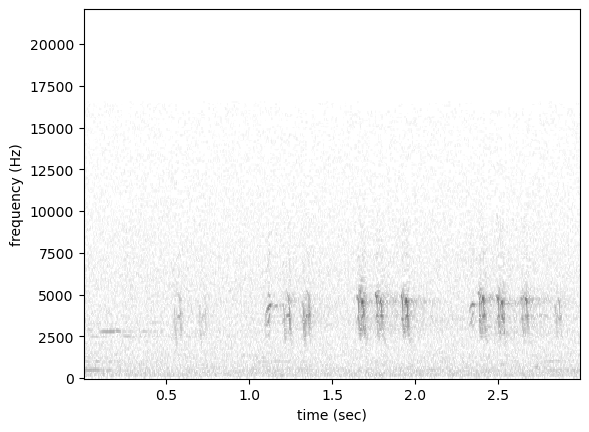

In [110]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-481327.flac 73.5 76.5
{'comment': 'Processed by SoX', 'samplerate': 44100, 'format': 'FLAC', 'frames': 13230000, 'sections': 1, 'subtype': 'PCM_16', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Present Prediction = 4.1621144191594794e-05 
Actual = 0.0
Check below


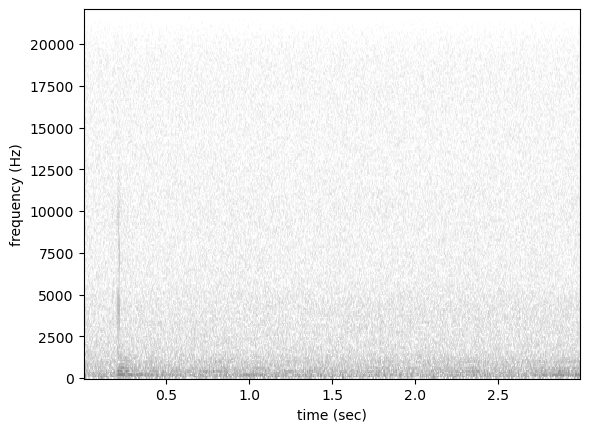

In [111]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-552930.flac 21.0 24.0
{'comment': 'Processed by SoX', 'samplerate': 44100, 'format': 'FLAC', 'frames': 13229824, 'sections': 1, 'subtype': 'PCM_16', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Present Prediction = 0.00023901640088297427 
Actual = 0.0
Check below


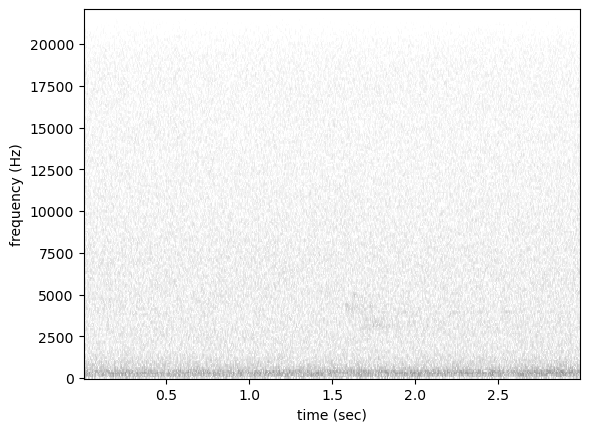

In [112]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-291482.mp3 4.5 7.5
{'samplerate': 44100, 'format': 'MP3', 'frames': 13259997, 'sections': 1, 'subtype': 'MPEG_LAYER_III', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Present Prediction = 0.0026896337512880564 
Actual = 0.0
Check below


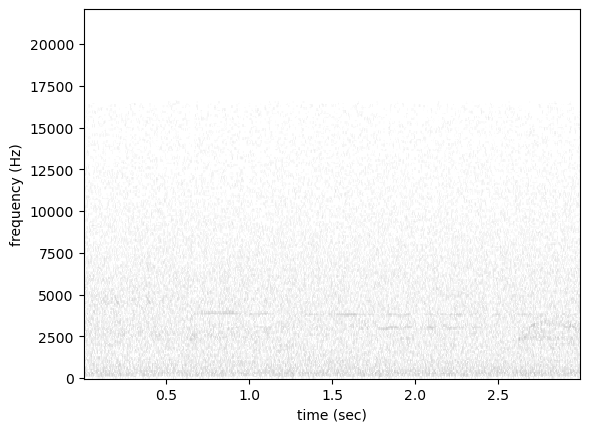

In [113]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-293421.mp3 88.5 91.5
{'samplerate': 44100, 'format': 'MP3', 'frames': 7957844, 'sections': 1, 'subtype': 'MPEG_LAYER_III', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Present Prediction = 0.0006022916059009731 
Actual = 0.0
Check below


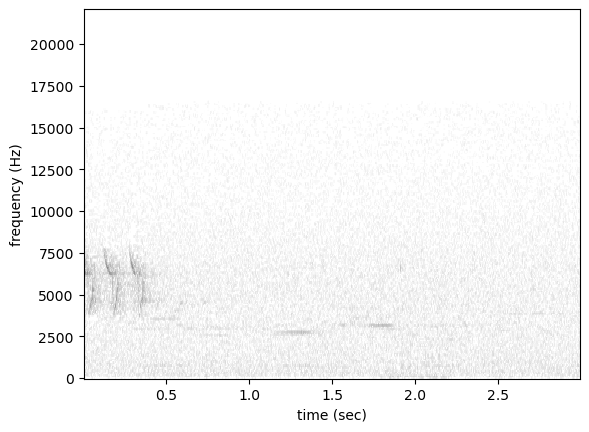

In [114]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-400969.flac 19.5 22.5
{'comment': 'Processed by SoX', 'samplerate': 32000, 'format': 'FLAC', 'frames': 5760128, 'sections': 1, 'subtype': 'PCM_16', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Present Prediction = 0.06491906195878983 
Actual = 0.0
Check below


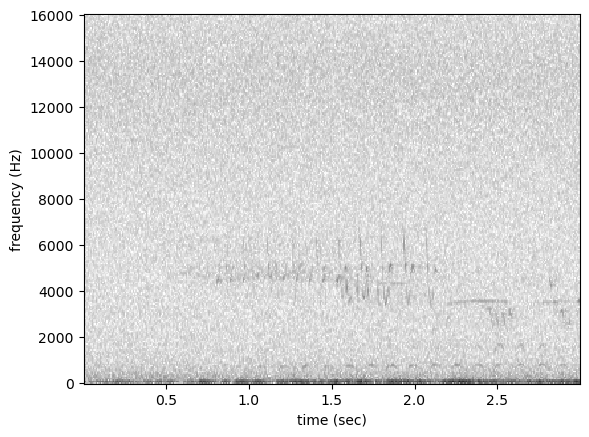

In [115]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-553720.flac 12.0 15.0
{'comment': 'Processed by SoX', 'samplerate': 44100, 'format': 'FLAC', 'frames': 7938000, 'sections': 1, 'subtype': 'PCM_16', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Present Prediction = 0.002232028404250741 
Actual = 0.0
Check below


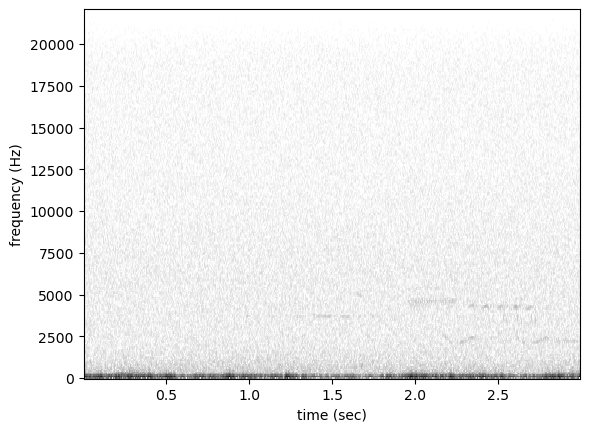

In [116]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-186153.mp3 0.0 3.0
{'samplerate': 24000, 'format': 'MP3', 'frames': 7201152, 'sections': 1, 'subtype': 'MPEG_LAYER_III', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Present Prediction = 0.9805810451507568 
Actual = 0.0
Check below


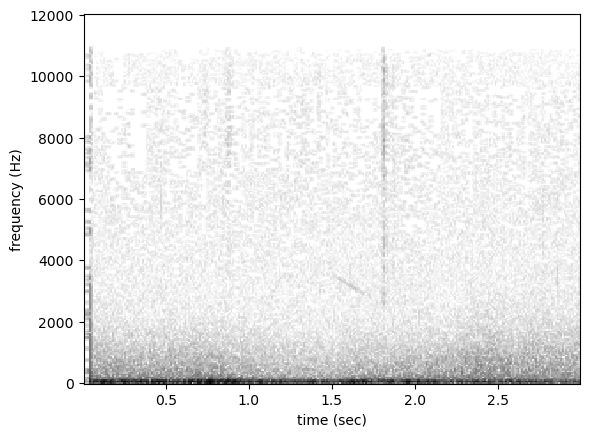

In [117]:
next_example_idx = show_example(next_example_idx)

# Check that the confusion matrix is working properly.

Here's the function which calculates the metrics. 


``` py
def single_target_metrics(targets, scores):
    """generate various metrics for a set of scores and labels (targets)

    Predicts 1 for the highest scoring class per sample and 0 for
    all other classes.

    Args:
        targets: 0/1 lables in 2d array
        scores: continuous values in 2d array

    Returns:
        metrics_dict: dictionary of various overall and per-class metrics

    """
    if max(np.sum(targets, 1)) > 1:
        raise ValueError(
            "Labels were not single target! "
            "Use multi-target classifier if multiple classes can be present "
            "in a single sample."
        )

    metrics_dict = {}

    preds = predict_single_target_labels(scores=scores)

    # Confusion matrix requires numbered-class not one-hot labels
    t = np.argmax(targets, 1)
    p = np.argmax(preds, 1)
    metrics_dict["confusion_matrix"] = M.confusion_matrix(t, p)

    # precision, recall, and f1
    pre, rec, f1, _ = M.precision_recall_fscore_support(
        targets, preds, average=None, zero_division=0
    )
    metrics_dict.update({"precision": pre[1], "recall": rec[1], "f1": f1[1]})

    try:
        metrics_dict["jaccard"] = M.jaccard_score(targets, preds, average="macro")
    except ValueError:
        metrics_dict["jaccard"] = np.nan
    try:
        metrics_dict["hamming_loss"] = M.hamming_loss(targets, preds)
    except ValueError:
        metrics_dict["hamming_loss"] = np.nan

    return metrics_dict
    ```

In [120]:
np.argmax(sample_targets, axis=1),np.argmax(sample_scores, axis=1)

(array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]),
 array([0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1]))

In [121]:
sample_targets = combined[["absent_label", "present_label"]]
sample_scores = combined[["absent_pred", "present_pred"]]
opso.metrics.single_target_metrics(sample_targets, sample_scores)

# [TN, FP]
# [FN, TP]

{'confusion_matrix': array([[9, 1],
        [4, 6]]),
 'precision': 0.8571428571428571,
 'recall': 0.6,
 'f1': 0.7058823529411764,
 'jaccard': 0.5941558441558441,
 'hamming_loss': 0.25}

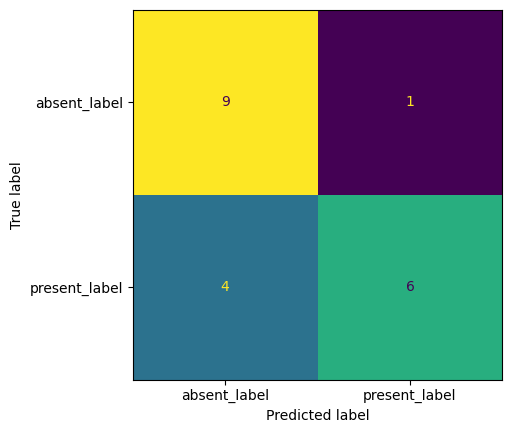

In [122]:
opso.metrics.M.ConfusionMatrixDisplay.from_predictions(np.argmax(sample_targets,1), np.argmax(sample_scores,1),display_labels = sample_targets.columns, colorbar=False)

In [124]:
model.classes

['target_absence', 'target_presence']

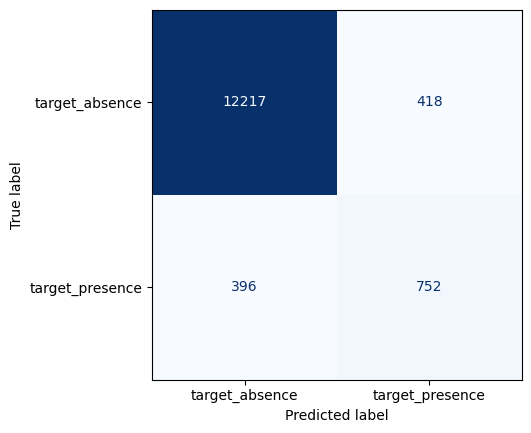

In [125]:
cm = opso.metrics.M.confusion_matrix(np.argmax(valid_set, 1), np.argmax(valid_set_preds, 1))
opso.metrics.M.ConfusionMatrixDisplay(cm, display_labels=valid_set.columns).plot(cmap='Blues', colorbar=False)

# Understanding the scikitlearn metrics 
### From the skleaern user guide 

#### 3.3. Metrics and scoring: quantifying the quality of predictions¶
##### 3.3.2.1. From binary to multiclass and multilabel

Some metrics are essentially defined for binary classification tasks (e.g. f1_score, roc_auc_score). In these cases, by default only the positive label is evaluated, assuming by default that the positive class is labelled 1 (though this may be configurable through the pos_label parameter).

In extending a binary metric to multiclass or multilabel problems, the data is treated as a collection of binary problems, one for each class. There are then a number of ways to average binary metric calculations across the set of classes, each of which may be useful in some scenario. Where available, you should select among these using the average parameter.

    "macro" simply calculates the mean of the binary metrics, giving equal weight to each class. In problems where infrequent classes are nonetheless important, macro-averaging may be a means of highlighting their performance. On the other hand, the assumption that all classes are equally important is often untrue, such that macro-averaging will over-emphasize the typically low performance on an infrequent class.

    "weighted" accounts for class imbalance by computing the average of binary metrics in which each class’s score is weighted by its presence in the true data sample.

    "micro" gives each sample-class pair an equal contribution to the overall metric (except as a result of sample-weight). Rather than summing the metric per class, this sums the dividends and divisors that make up the per-class metrics to calculate an overall quotient. Micro-averaging may be preferred in multilabel settings, including multiclass classification where a majority class is to be ignored.

    "samples" applies only to multilabel problems. It does not calculate a per-class measure, instead calculating the metric over the true and predicted classes for each sample in the evaluation data, and returning their (sample_weight-weighted) average.

    Selecting average=None will return an array with the score for each class.


In [126]:
opso.metrics.single_target_metrics(valid_set, valid_set_preds)

{'confusion_matrix': array([[12217,   418],
        [  396,   752]]),
 'precision': 0.6427350427350428,
 'recall': 0.6550522648083623,
 'f1': 0.6488352027610009,
 'jaccard': 0.708868958029448,
 'hamming_loss': 0.05905826017557861}

In [51]:
# changing pos_label to 0 will give the precision for the absent class
opso.metrics.M.precision_score(np.argmax(valid_set, 1), np.argmax(valid_set_preds, 1), pos_label=1, average='binary')

0.584406779661017

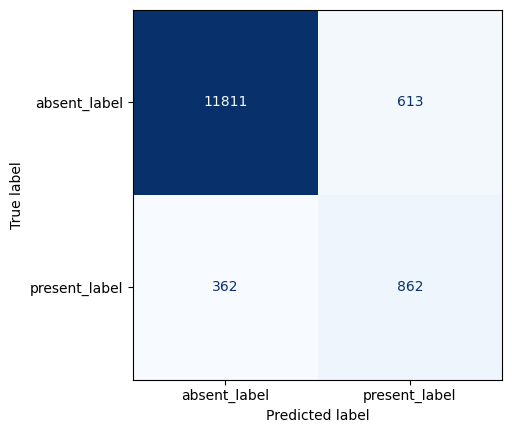

In [52]:
opso.metrics.M.ConfusionMatrixDisplay.from_predictions(np.argmax(valid_set,1), np.argmax(valid_set_preds,1),display_labels = sample_targets.columns, cmap="Blues", colorbar=False)

In [128]:
model.valid_metrics

{0: {'confusion_matrix': array([[   42, 12593],
         [    4,  1144]]),
  'precision': 0.08327873625973647,
  'recall': 0.9965156794425087,
  'f1': 0.1537117903930131,
  'jaccard': 0.04328877077999552,
  'hamming_loss': 0.9139519698178916},
 1: {'confusion_matrix': array([[  416, 12219],
         [   18,  1130]]),
  'precision': 0.08465053562064574,
  'recall': 0.9843205574912892,
  'f1': 0.15589432296337172,
  'jaccard': 0.05870706183160341,
  'hamming_loss': 0.887832837553508},
 2: {'confusion_matrix': array([[5074, 7561],
         [ 185,  963]]),
  'precision': 0.1129751290473956,
  'recall': 0.8388501742160279,
  'f1': 0.19913151364764267,
  'jaccard': 0.25318154923923447,
  'hamming_loss': 0.5619966625553218},
 3: {'confusion_matrix': array([[12275,   360],
         [  742,   406]]),
  'precision': 0.5300261096605744,
  'recall': 0.35365853658536583,
  'f1': 0.42424242424242425,
  'jaccard': 0.5934252822007924,
  'hamming_loss': 0.07995356598708554},
 4: {'confusion_matrix': ar

The precision calculation from sklearn should be ordered like this. 

![Screenshot 2024-02-27 at 11.51.53.png](<attachment:Screenshot 2024-02-27 at 11.51.53.png>)
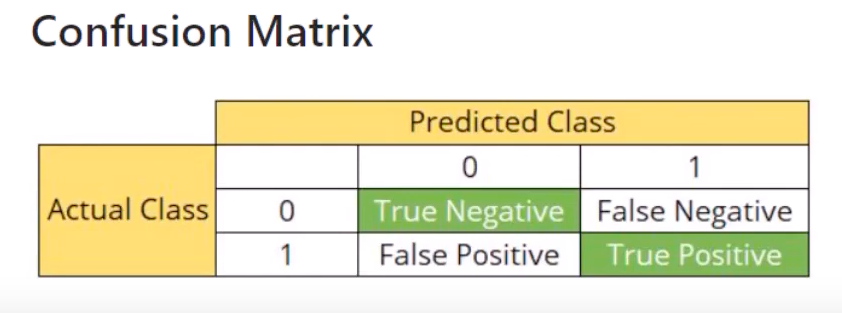

Predicted Class [0, 1] <br>
Actual Class 0 [TN, FN] <br>
Actual Class 1 [FP, TP]

# Plot top losses

In [129]:
valid_set_preds_renamed = valid_set_preds.rename(columns = {'target_presence':'present_pred', 'target_absence':'absent_pred'})
combined_full = pd.concat([valid_set, valid_set_preds_renamed], axis=1)

combined_full['loss'] = np.abs(combined_full['target_presence'] - combined_full['present_pred'])
top_losses = combined_full.sort_values(by='loss', ascending=False)

top_losses.head()


,,,target_absence,target_presence,absent_pred,present_pred,loss
file,start_time,end_time,,,,,
../../data/raw/recordings/OSFL/recording-357693.mp3,6.0,9.0,0.0,1.0,1.000000,8.331190e-08,1.000000
../../data/raw/recordings/OSFL/recording-552869.flac,193.5,196.5,0.0,1.0,1.000000,4.596526e-07,1.000000
../../data/raw/recordings/OSFL/recording-553430.flac,45.0,48.0,0.0,1.0,1.000000,5.080457e-07,0.999999
../../data/raw/recordings/OSFL/recording-297001.mp3,34.5,37.5,0.0,1.0,0.999999,1.179203e-06,0.999999
../../data/raw/recordings/OSFL/recording-357693.mp3,7.5,10.5,0.0,1.0,0.999999,1.282615e-06,0.999999


In [134]:
idx=0

In [348]:

def show_false_negatives(idx):
    df = top_losses.loc[top_losses.target_presence == 1.0]
    print(f"Predicted = {df.iloc[idx].present_pred}")
    print(f"Actual = {df.iloc[idx].target_presence}")
    show_sample_from_df(df, idx)

def show_false_positives(idx):
    df = top_losses.loc[top_losses.target_presence == 0.0]
    print(f"Predicted = {df.iloc[idx].present_pred}")
    print(f"Actual = {df.iloc[idx].target_presence}")
    show_sample_from_df(df, idx)

In [285]:
idx = 0

Predicted = 0.9973906874656677
Actual = 0.0
../../data/raw/recordings/OSFL/recording-815665.flac 27.0 30.0


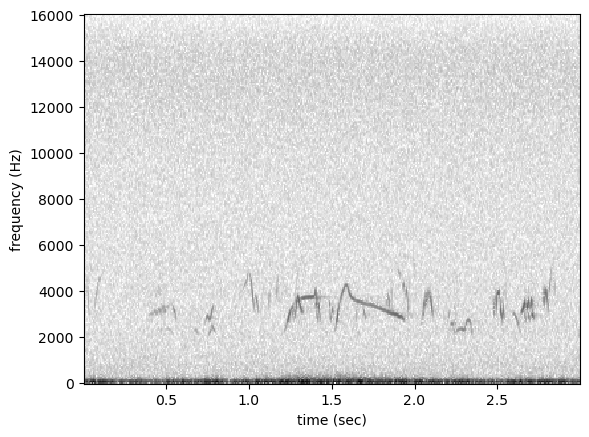

In [350]:
show_false_positives(idx)
idx+=1

Predicted = 0.0001690797507762909
Actual = 1.0
../../data/raw/recordings/OSFL/recording-552618.flac 16.5 19.5


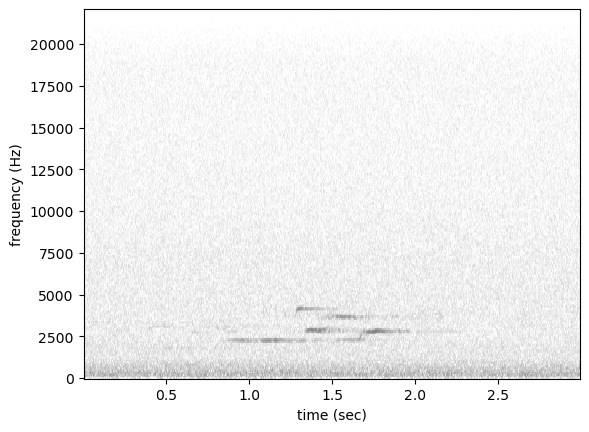

In [347]:
show_false_negatives(idx)
idx += 1

In [ ]:
idx = 0

Predicted = 0.00018074129184242338
Actual = 1.0
../../data/raw/recordings/OSFL/recording-294087.mp3 18.0 21.0


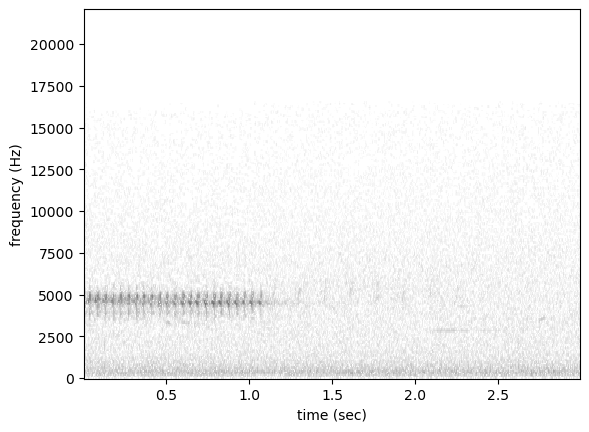

In [349]:
show_true_positives(idx)
idx += 1

# Conclusion
In this notebook I found that the order of the classes is important - during model training, the absent class must be at index 0 and the present class must be at index 1 otherwise the confusion matrix and calculations won't be correct. 

Further work for this notebook:

1. show confusion matrix Done
2. plot the examples with the highest losses. 